### Define Model

In [11]:
import sys
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 1. 核心組件導入
from anomalib.engine import Engine
from anomalib.data import MVTecAD

# 嘗試精確導入所有模型類別 (相容 1.1+ 結構)
try:
    # 既有模型
    from anomalib.models.image.padim.lightning_model import Padim
    from anomalib.models.image.efficient_ad.lightning_model import EfficientAd
    from anomalib.models.image.csflow.lightning_model import Csflow
    from anomalib.models.image.cflow.lightning_model import Cflow
    from anomalib.models.image.cfa.lightning_model import Cfa
    # 前次新增模型
    from anomalib.models.image.dfkde.lightning_model import Dfkde
    from anomalib.models.image.dfm.lightning_model import Dfm
    from anomalib.models.image.dinomaly.lightning_model import Dinomaly
    from anomalib.models.image.draem.lightning_model import Draem
    from anomalib.models.image.dsr.lightning_model import Dsr
    # 本次新增模型
    from anomalib.models.image.supersimplenet.lightning_model import Supersimplenet
except ImportError as e:
    print(f"⚠️ 部分模型導入失敗，請確認路徑或拼寫: {e}")

# 環境設置
os.environ["ANOMALIB_SHOW_PROGRESS_BAR"] = "0"
os.environ["TOKENIZERS_PARALLELISM"] = "false"

# 2. 資料工廠 (Data Factory)
class MVTecDataFactory:
    def __init__(self, root="../datasets/MVTec"):
        self.root = root

    def create(self, category, batch_size=32):
        datamodule = MVTecAD(
            root=self.root,
            category=category,
            train_batch_size=batch_size,
            eval_batch_size=batch_size,
            num_workers=0              
        )
        datamodule.setup()
        return datamodule

# 3. 異常檢測執行器 (Anomaly Runner)
class AnomalyRunner:
    def __init__(self, model_type, category):
        self.model_type = model_type.lower()
        self.category = category

    def _get_model(self):
        try:
            from tqdm import tqdm as real_tqdm
            real_tqdm.close = lambda self: None 
        except: pass

        # 完整模型映射表
        models = {
            "padim": Padim, 
            "efficient_ad": EfficientAd, 
            "csflow": Csflow,
            "cflow": Cflow, 
            "cfa": Cfa, 
            "dfkde": Dfkde, 
            "dfm": Dfm,
            "dinomaly": Dinomaly, 
            "draem": Draem, 
            "dsr": Dsr,
            "supersimplenet": Supersimplenet  # <--- 已加入
        }

        if self.model_type in models:
            print(f"📦 正在初始化 {self.model_type.upper()} 模型結構...")
            return models[self.model_type]()
        
        print(f"❌ 找不到模型類型: {self.model_type}")
        return None

    def execute(self, factory):
        model = self._get_model()
        if model is None: return
        
        # 記憶體優化策略
        if self.model_type == "efficient_ad":
            bs = 1
        elif self.model_type in ["draem", "dsr", "dinomaly", "supersimplenet"]:
            bs = 8  # 這些模型在訓練時特徵維度較高或含合成邏輯，bs=8 對 RTX 5070 最穩
        else:
            bs = 16
            
        dm = factory.create(category=self.category, batch_size=bs)

        # 核心修正：加入 logger=False 解決 'NoneType' 報錯
        engine = Engine(
            default_root_dir=f"./results/{self.model_type}/{self.category}",
            devices=1,
            accelerator="auto",
            callbacks=[],           
            enable_progress_bar=False, 
            logger=False,            
            max_epochs=15 if self.model_type == "supersimplenet" else (20 if self.model_type in ["draem", "dsr"] else 10)
        )

        print(f"🛠️  正在執行 {self.model_type.upper()} 訓練與推論...")
        engine.fit(model=model, datamodule=dm)
        
        # 直接呈現預測結果
        self.visualize_predictions(engine, model, dm)
        
        metrics = engine.test(model=model, datamodule=dm)
        return {"metrics": metrics}

    def visualize_predictions(self, engine, model, dm, num_samples=3):
        print(f"🖼️  正在生成預測熱力圖...")
        predictions = engine.predict(model=model, datamodule=dm)
        
        if not predictions: 
            print("⚠️ 無法獲取預測結果。")
            return

        processed_count = 0
        for batch in predictions:
            images = getattr(batch, "image", None)
            
            # 搜尋熱力圖欄位
            h_map = None
            for attr in ["anomaly_map", "anomaly_maps", "pred_masks", "explanation"]:
                h_map = getattr(batch, attr, None)
                if h_map is not None: break

            if images is None or h_map is None:
                print(f"⚠️ 模型 {self.model_type} 未輸出像素級熱力圖欄位。")
                return 

            for i in range(len(images)):
                if processed_count >= num_samples: return
                
                # 影像轉換與歸一化
                img = images[i].cpu().numpy().transpose(1, 2, 0)
                img = (img - img.min()) / (img.max() - img.min() + 1e-8)
                
                # 處理熱力圖維度 (H, W)
                display_map = h_map[i].cpu().numpy().squeeze()
                
                plt.figure(figsize=(12, 4))
                plt.subplot(1, 3, 1); plt.imshow(img); plt.title("Original"); plt.axis("off")
                plt.subplot(1, 3, 2); plt.imshow(display_map, cmap="jet"); plt.title("Heatmap"); plt.axis("off")
                plt.subplot(1, 3, 3); plt.imshow(img); plt.imshow(display_map, cmap="jet", alpha=0.4)
                plt.title("Overlay"); plt.axis("off")
                plt.show()
                
                processed_count += 1

### Experiment

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
You are using a CUDA device ('NVIDIA GeForce RTX 5070') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


🛠️  正在執行 PADIM 模型...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/core/optimizer.py:183: `LightningModule.configure_optimizers` returned `None`, this fit will run with no optimizer


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator     │      0 │ train │     0 │
│ 3 │ model          │ PadimModel    │  2.8 M │ train │     0 │
└───┴────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 2.8 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 2.8 M                                                                                                
Total estimated model params size (MB): 11                                                                         
Modules in train mode: 19                                                                                          
Modules in eval mode: 69                                                                                           
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 69 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If th

🖼️  正在生成預測熱力圖 (直接呈現於 Jupyter)...


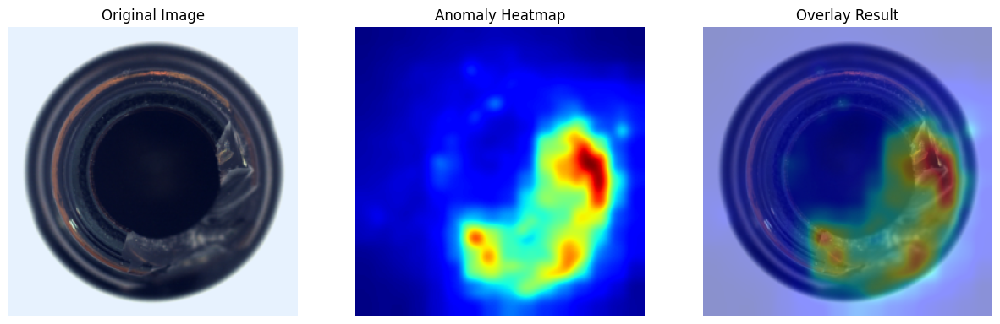

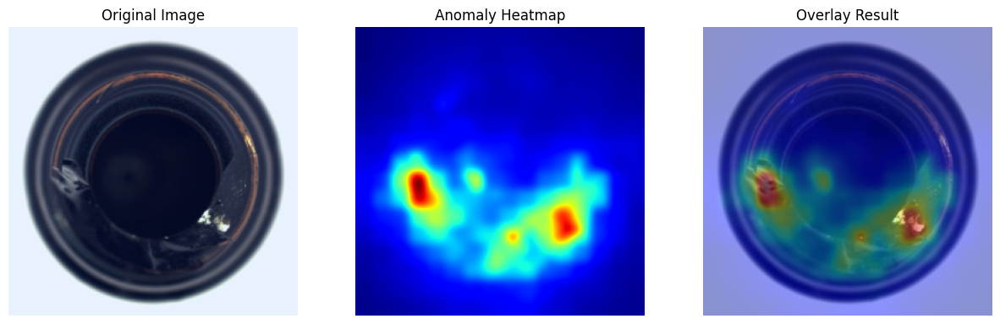

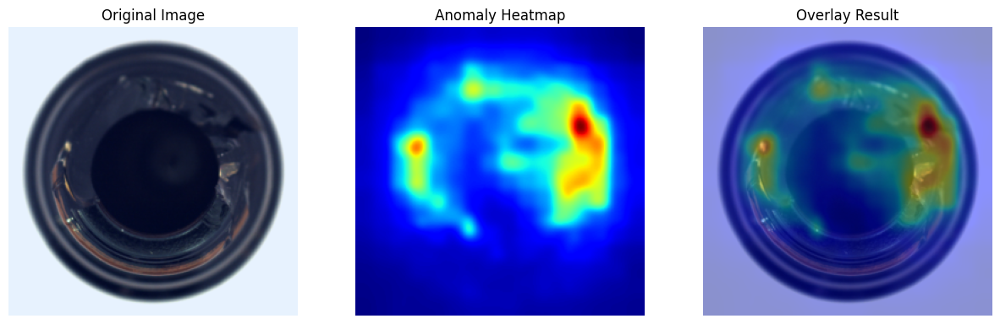

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9936508536338806     │
│       image_F1Score       │    0.9763779640197754     │
│        pixel_AUROC        │    0.9786670207977295     │
│       pixel_F1Score       │    0.6750478744506836     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 PADIM 模型在 bottle 類別的表現:
   - image_AUROC: 0.9937
   - image_F1Score: 0.9764
   - pixel_AUROC: 0.9787
   - pixel_F1Score: 0.6750


In [2]:
MODEL_NAME = "padim" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練、預測與視覺化 (預設會直接在 Jupyter 顯示圖片)
    result = runner.execute(factory)
    
    # 3. 打印最終指標 (修正 metrics 取值邏輯)
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    
    # Anomalib 的 metrics 輸出通常是 [{'image_AUROC': 0.99, ...}]
    metrics_data = result["metrics"]
    # 判斷 metrics_data 是 list 還是 dict 並進行打印
    current_metrics = metrics_data[0] if isinstance(metrics_data, list) else metrics_data
    
    for metric_name, value in current_metrics.items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤。目前已使用 Python 3.11 應可避免此問題。")
finally:
    # 釋放 RTX 5070 顯存 (這對持續實驗非常重要)
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


🛠️  正在執行 CSFLOW 模型...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator     │      0 │ train │     0 │
│ 3 │ model          │ CsFlowModel   │  305 M │ train │     0 │
│ 4 │ loss           │ CsFlowLoss    │      0 │ train │     0 │
└───┴────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 305 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 305 M                                                                                                
Total estimated model params size (MB): 1.2 K                                                                      
Modules in train mode: 133                                                                                         
Modules in eval mode: 871                                                                                          
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 871 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If t

🖼️  正在生成預測熱力圖 (直接呈現於 Jupyter)...


/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


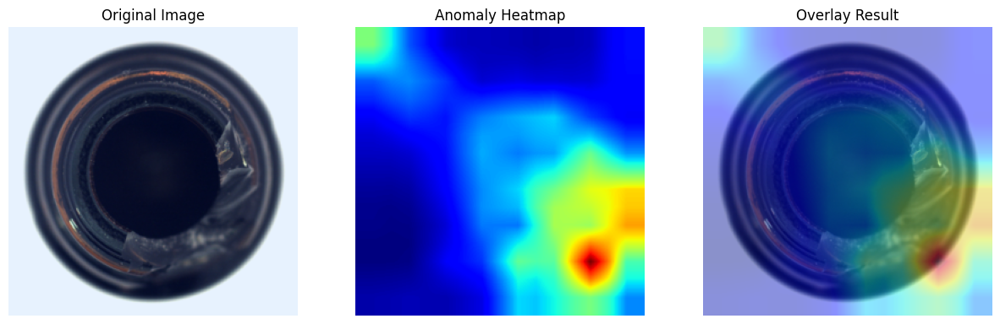

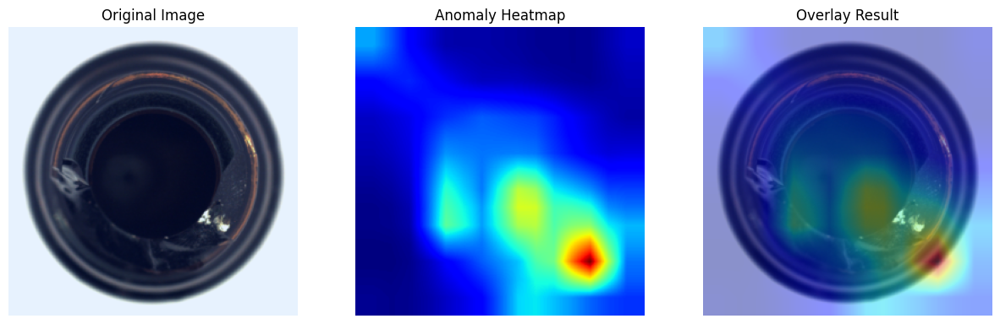

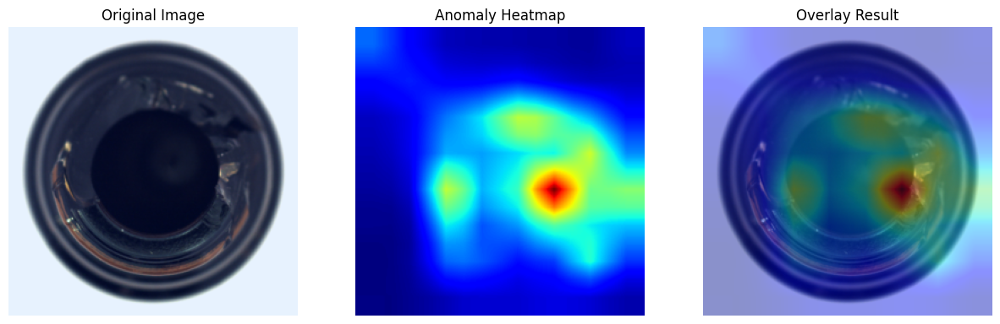

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9984126687049866     │
│       image_F1Score       │    0.9841269850730896     │
│        pixel_AUROC        │    0.8808707594871521     │
│       pixel_F1Score       │    0.3595331609249115     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 CSFLOW 模型在 bottle 類別的表現:
❌ 執行失敗: 0


In [3]:
MODEL_NAME = "csflow" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


🛠️  正在執行 EFFICIENT_AD 模型...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type             ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor     │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor    │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator        │      0 │ train │     0 │
│ 3 │ model          │ EfficientAdModel │  8.1 M │ train │     0 │
└───┴────────────────┴──────────────────┴────────┴───────┴───────┘

Trainable params: 8.1 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 8.1 M                                                                                                
Total estimated model params size (MB): 32                                                                         
Modules in train mode: 48                                                                                          
Modules in eval mode: 7                                                                                            
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 7 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If thi

🖼️  正在生成預測熱力圖 (直接呈現於 Jupyter)...


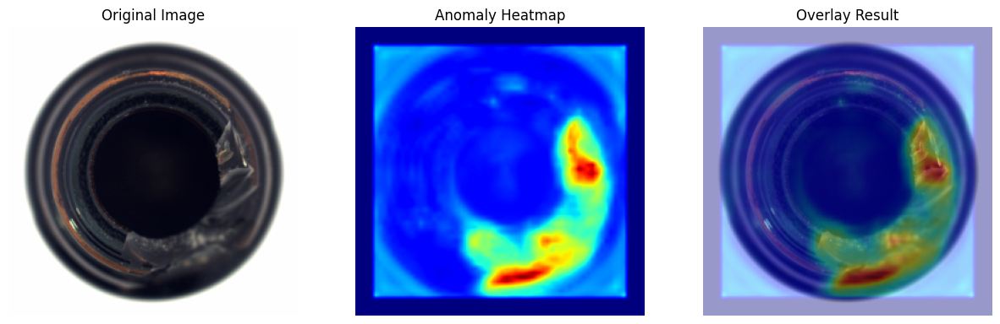

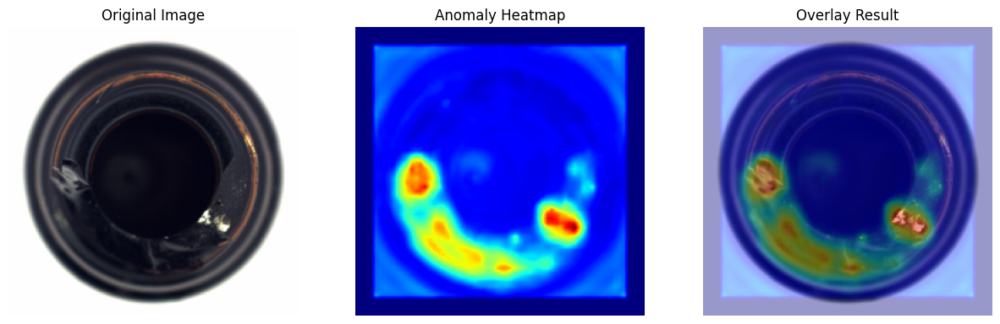

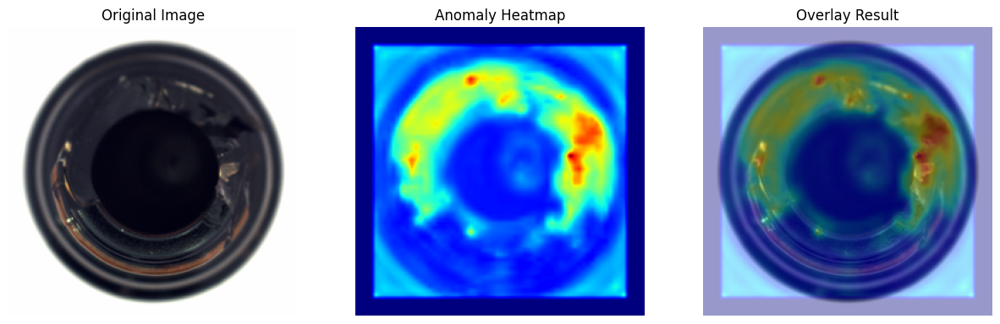

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9992064237594604     │
│       image_F1Score       │    0.9841269850730896     │
│        pixel_AUROC        │    0.9693461060523987     │
│       pixel_F1Score       │     0.747414231300354     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 EFFICIENT_AD 模型在 bottle 類別的表現:
❌ 執行失敗: 0


In [4]:
MODEL_NAME = "efficient_ad" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

📦 正在初始化 CFLOW 模型結構...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
You are using a CUDA device ('NVIDIA GeForce RTX 5070') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


🛠️  正在執行 CFLOW 訓練與推論...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator     │      0 │ train │     0 │
│ 3 │ model          │ CflowModel    │  236 M │ train │     0 │
└───┴────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 81.6 M                                                                                           
Non-trainable params: 154 M                                                                                        
Total params: 236 M                                                                                                
Total estimated model params size (MB): 946                                                                        
Modules in train mode: 145                                                                                         
Modules in eval mode: 214                                                                                          
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 214 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If t

🖼️  正在生成預測熱力圖...


/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


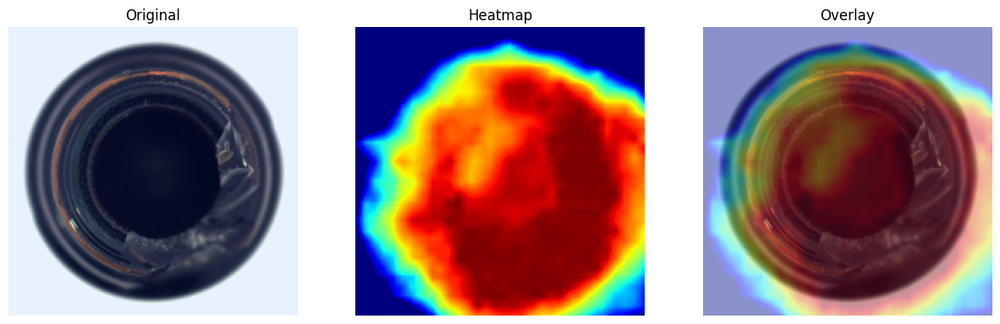

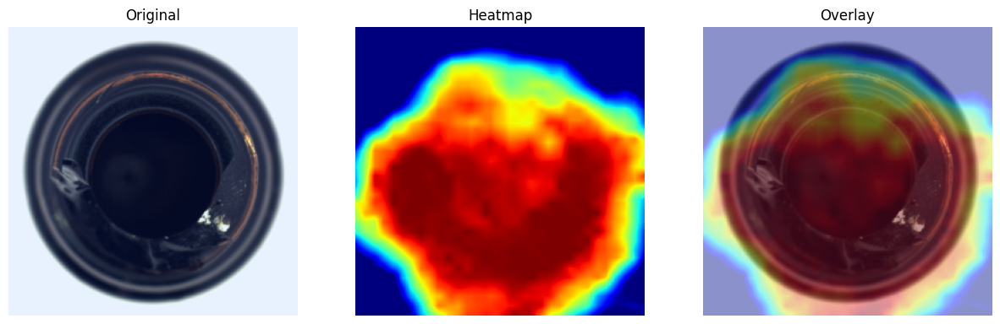

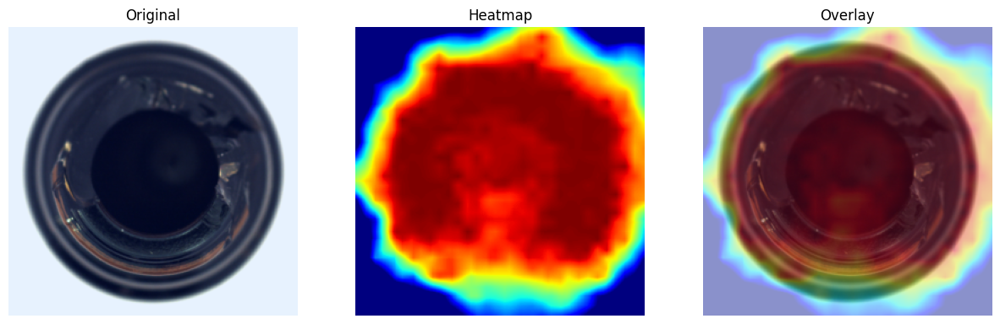

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │            1.0            │
│       image_F1Score       │    0.9919999837875366     │
│        pixel_AUROC        │    0.9807562828063965     │
│       pixel_F1Score       │    0.7270837426185608     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 CFLOW 模型在 bottle 類別的表現:
❌ 執行失敗: 0


In [4]:
MODEL_NAME = "cflow" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

📦 正在初始化 CFA 模型結構...


/usr/local/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Wide_ResNet50_2_Weights.IMAGENET1K_V1`. You can also use `weights=Wide_ResNet50_2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


🛠️  正在執行 CFA 訓練與推論...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator     │      0 │ train │     0 │
│ 3 │ model          │ CfaModel      │ 31.3 M │ train │     0 │
│ 4 │ loss           │ CfaLoss       │      0 │ train │     0 │
└───┴────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 31.3 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 31.3 M                                                                                               
Total estimated model params size (MB): 125                                                                        
Modules in train mode: 22                                                                                          
Modules in eval mode: 121                                                                                          
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 121 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If t

🖼️  正在生成預測熱力圖...


/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


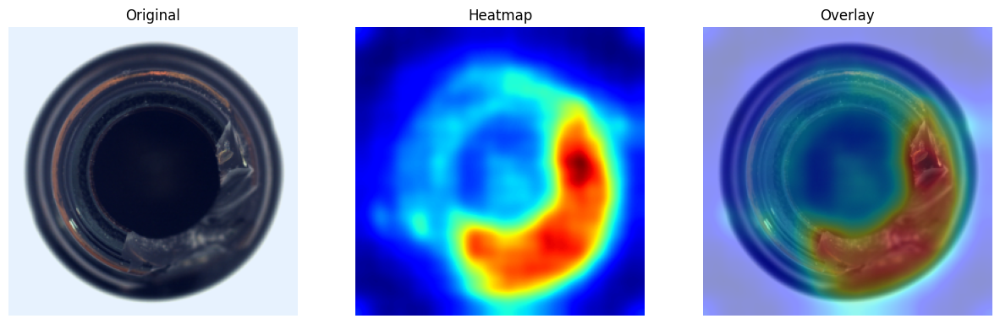

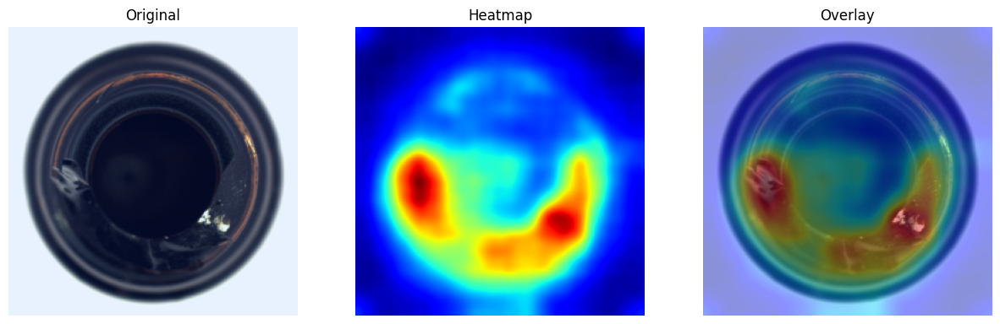

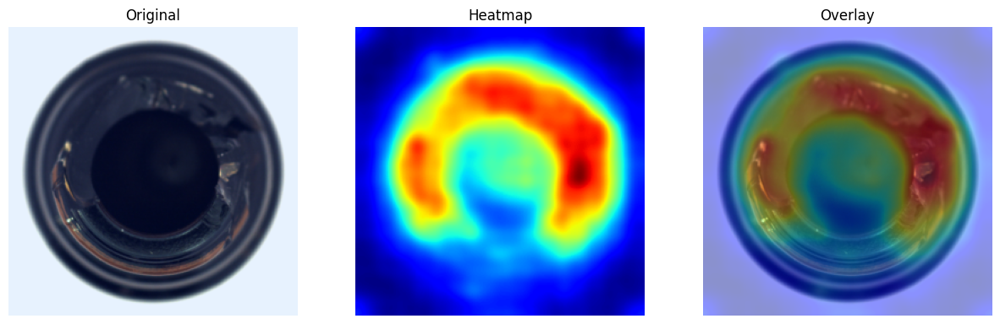

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │            1.0            │
│       image_F1Score       │    0.9919999837875366     │
│        pixel_AUROC        │    0.9865361452102661     │
│       pixel_F1Score       │    0.7477176785469055     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 CFA 模型在 bottle 類別的表現:
❌ 執行失敗: 0


In [5]:
MODEL_NAME = "cfa" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

📦 正在初始化 DFM 模型結構...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


🛠️  正在執行 DFM 訓練與推論...


You are using a CUDA device ('NVIDIA GeForce RTX 5070') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/core/optimizer.py:183: `LightningModule.configure_optimizers` returned `None`, this fit will run with no optimizer


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator     │      0 │ train │     0 │
│ 3 │ model          │ DFMModel      │  8.5 M │ train │     0 │
└───┴────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 8.5 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 8.5 M                                                                                                
Total estimated model params size (MB): 34                                                                         
Modules in train mode: 18                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 174 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If t

🖼️  正在生成預測熱力圖...


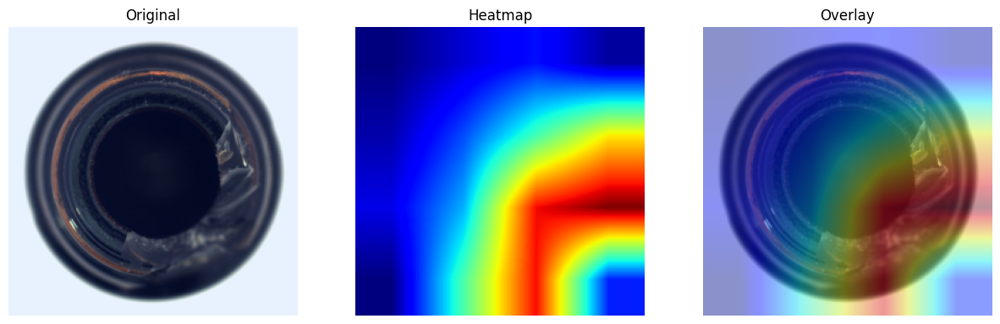

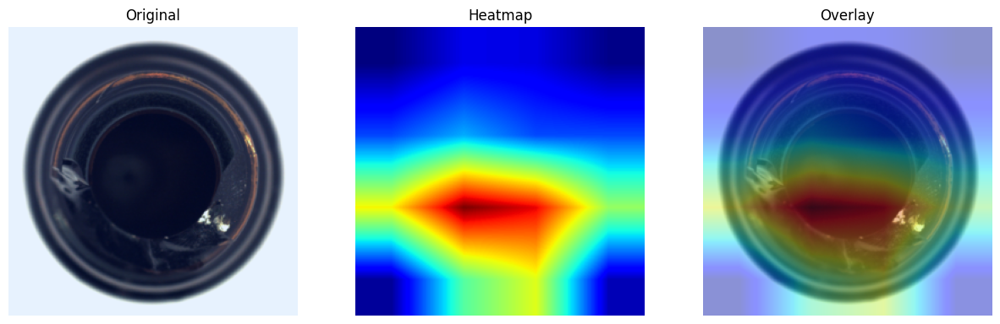

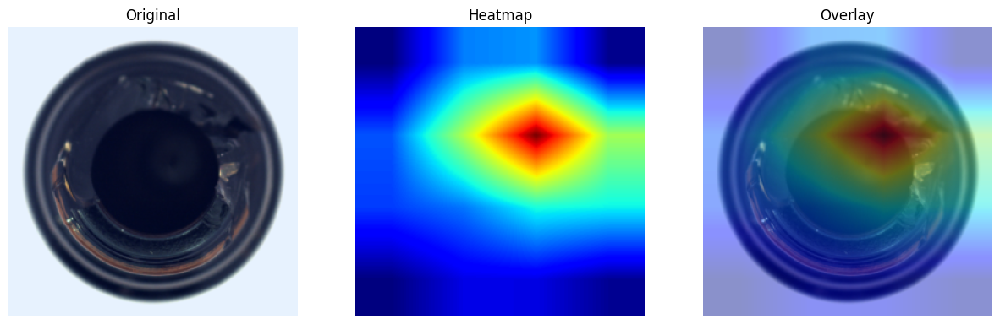

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9992063641548157     │
│       image_F1Score       │    0.9841269850730896     │
│        pixel_AUROC        │    0.9387631416320801     │
│       pixel_F1Score       │     0.485319048166275     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 DFM 模型在 bottle 類別的表現:
❌ 執行失敗: 0


In [2]:
MODEL_NAME = "dfm" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

In [7]:
MODEL_NAME = "dfkde" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

📦 正在初始化 DFKDE 模型結構...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


🛠️  正在執行 DFKDE 訓練與推論...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/core/optimizer.py:183: `LightningModule.configure_optimizers` returned `None`, this fit will run with no optimizer


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator     │      0 │ train │     0 │
│ 3 │ model          │ DfkdeModel    │ 11.2 M │ train │     0 │
└───┴────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 11.2 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 11.2 M                                                                                               
Total estimated model params size (MB): 44                                                                         
Modules in train mode: 17                                                                                          
Modules in eval mode: 91                                                                                           
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 91 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If th

🖼️  正在生成預測熱力圖...


The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


⚠️ 模型 dfkde 未輸出像素級熱力圖。


/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9595238566398621     │
│       image_F1Score       │    0.9384615421295166     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 DFKDE 模型在 bottle 類別的表現:
❌ 執行失敗: 0


📦 正在初始化 DINOMALY 模型結構...


DINOv2 dinov2_reg base weights: 100%|███████████████████████████████████████████████▉| 346M/346M [00:14<00:00, 18.5MB/s]GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


🛠️  正在執行 DINOMALY 訓練與推論...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name              ┃ Type          ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor     │ PreProcessor  │      0 │ train │     0 │
│ 1 │ post_processor    │ PostProcessor │      0 │ train │     0 │
│ 2 │ evaluator         │ Evaluator     │      0 │ train │     0 │
│ 3 │ model             │ DinomalyModel │  147 M │ train │     0 │
│ 4 │ trainable_modules │ ModuleList    │ 61.4 M │ train │     0 │
└───┴───────────────────┴───────────────┴────────┴───────┴───────┘

Trainable params: 61.4 M                                                                                           
Non-trainable params: 86.6 M                                                                                       
Total params: 147 M                                                                                                
Total estimated model params size (MB): 591                                                                        
Modules in train mode: 385                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculati

🖼️  正在生成預測熱力圖...


/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


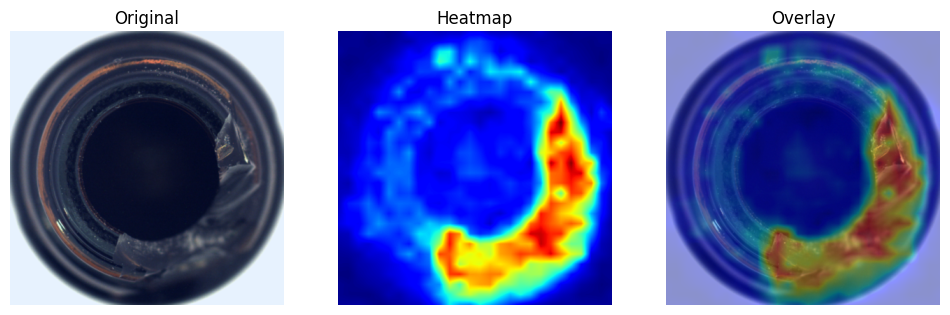

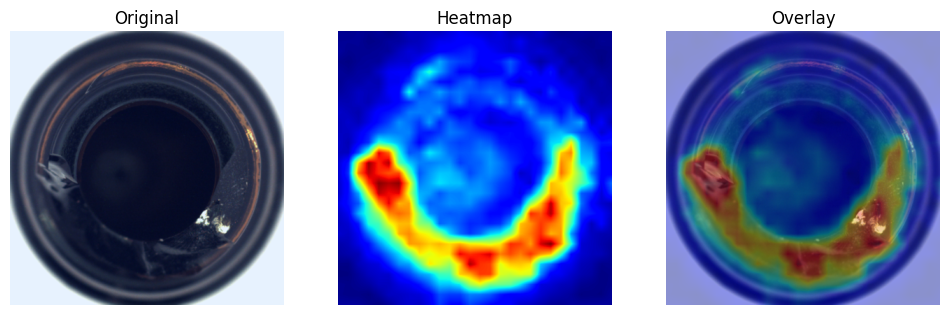

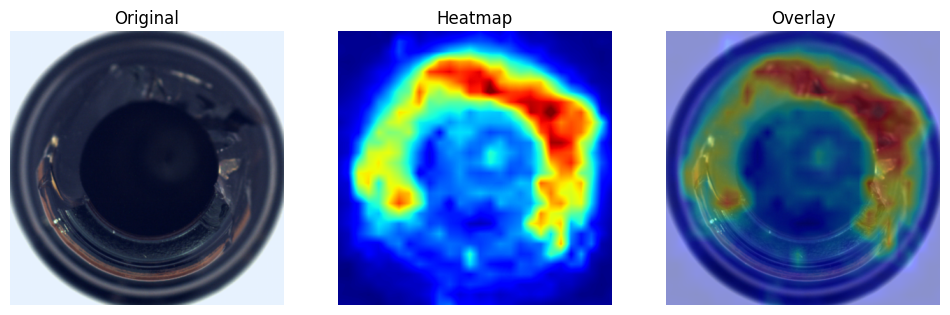

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │            1.0            │
│       image_F1Score       │    0.9919999837875366     │
│        pixel_AUROC        │    0.9876237511634827     │
│       pixel_F1Score       │    0.8088200092315674     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 DINOMALY 模型在 bottle 類別的表現:
❌ 執行失敗: 0


In [8]:
MODEL_NAME = "dinomaly" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

📦 正在初始化 DSR 模型結構...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


🛠️  正在執行 DSR 訓練與推論...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name                        ┃ Type                   ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor               │ PreProcessor           │      0 │ train │     0 │
│ 1 │ post_processor              │ PostProcessor          │      0 │ train │     0 │
│ 2 │ evaluator                   │ Evaluator              │      0 │ train │     0 │
│ 3 │ quantized_anomaly_generator │ DsrAnomalyGenerator    │      0 │ train │     0 │
│ 4 │ perlin_generator            │ PerlinAnomalyGenerator │      0 │ train │     0 │
│ 5 │ model                       │ DsrModel               │ 40.3 M │ train │     0 │
│ 6 │ second_stage_loss           │ DsrSecondStageLoss     │      0 │ train │     0 │
│ 7 │ third_stage_loss            │ DsrThirdStageLoss      │      0 │ train │     0 │
└───┴─────────────────────────────┴────────────────────────┴────────┴───────┴───────┘

Trainable params: 36.3 M                                                                                           
Non-trainable params: 4.0 M                                                                                        
Total params: 40.3 M                                                                                               
Total estimated model params size (MB): 161                                                                        
Modules in train mode: 388                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
vq_model_pretrained_128_4096.pckl:  92%|███████████████████████████████████████▊   | 13.9M/15.0M [00:02<00:00, 10.7MB/s]/usr/local/lib/python3.11/site-packages/lightning/pytorch/core/module.py:522: 

🖼️  正在生成預測熱力圖...


/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


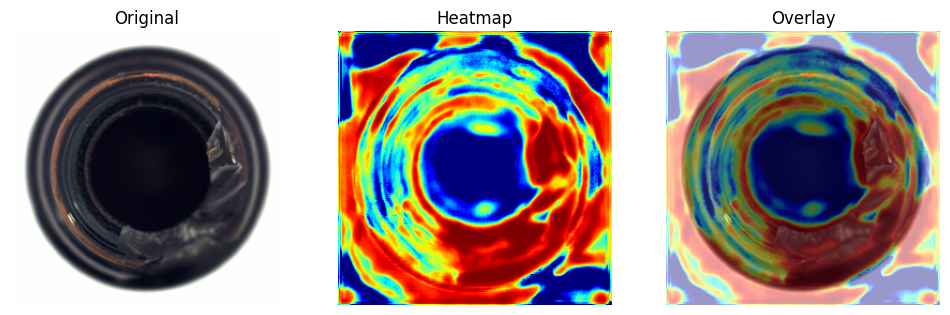

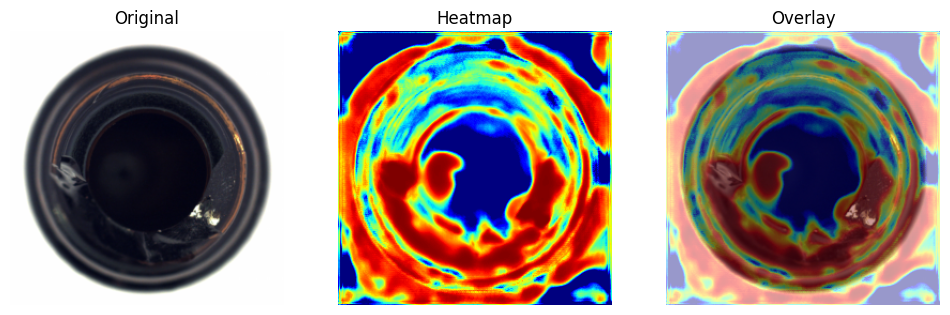

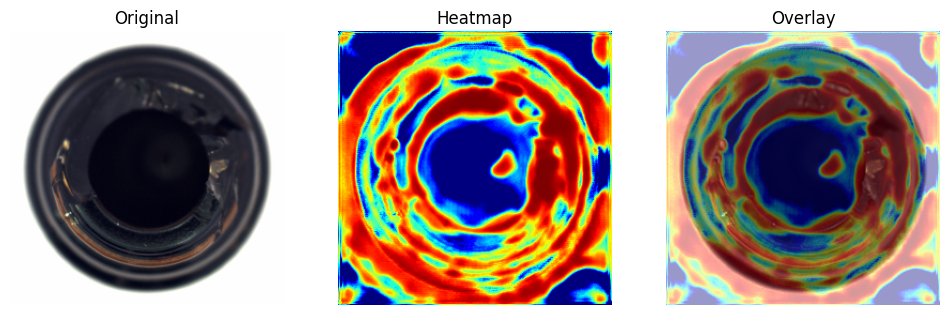

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.7396824955940247     │
│       image_F1Score       │    0.8551723957061768     │
│        pixel_AUROC        │    0.7669753432273865     │
│       pixel_F1Score       │    0.44528719782829285    │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 DSR 模型在 bottle 類別的表現:
❌ 執行失敗: 0


In [9]:
MODEL_NAME = "dsr" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

📦 正在初始化 DRAEM 模型結構...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


🛠️  正在執行 DRAEM 訓練與推論...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type                   ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor           │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor          │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator              │      0 │ train │     0 │
│ 3 │ augmenter      │ PerlinAnomalyGenerator │      0 │ train │     0 │
│ 4 │ model          │ DraemModel             │ 97.4 M │ train │     0 │
│ 5 │ loss           │ DraemLoss              │      0 │ train │     0 │
└───┴────────────────┴────────────────────────┴────────┴───────┴───────┘

Trainable params: 97.4 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 97.4 M                                                                                               
Total estimated model params size (MB): 389                                                                        
Modules in train mode: 236                                                                                         
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/core/module.py:522: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable one by doing `Traine

🖼️  正在生成預測熱力圖...


/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


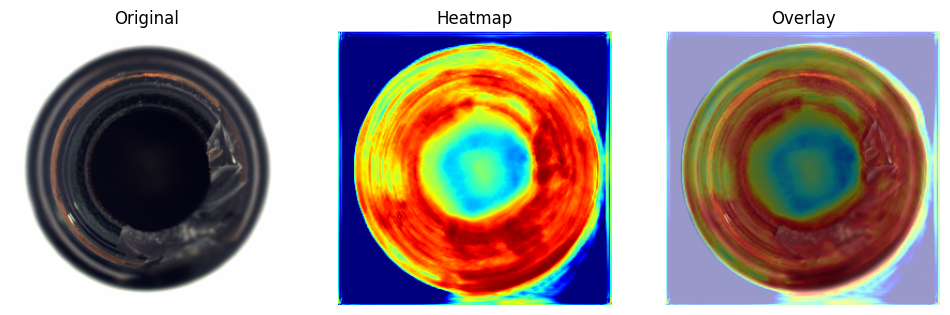

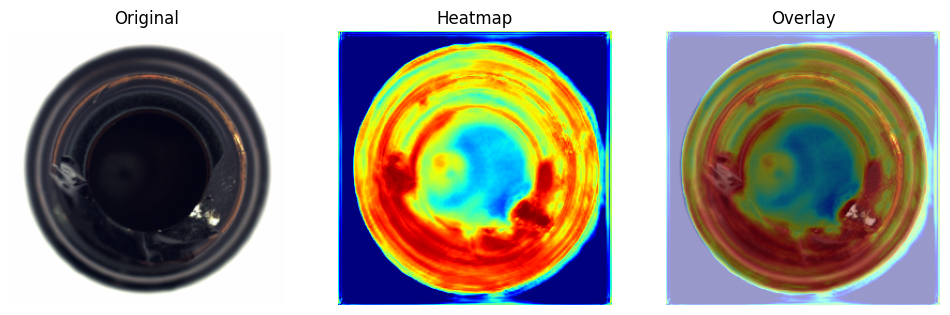

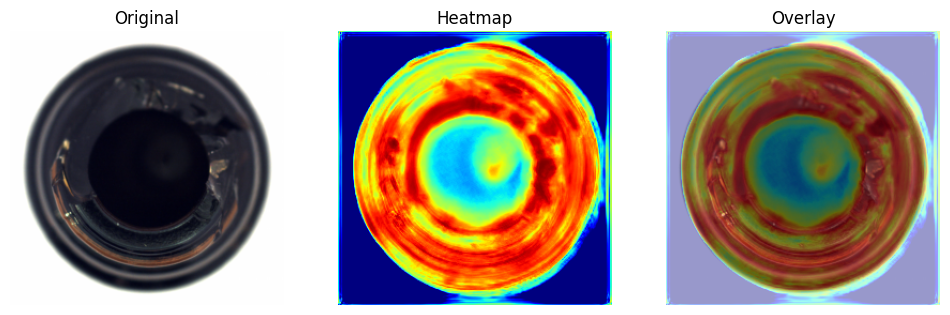

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9373016357421875     │
│       image_F1Score       │    0.9322034120559692     │
│        pixel_AUROC        │    0.8997762203216553     │
│       pixel_F1Score       │    0.4829893112182617     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 DRAEM 模型在 bottle 類別的表現:
❌ 執行失敗: 0


In [10]:
MODEL_NAME = "draem" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

📦 正在初始化 SUPERSIMPLENET 模型結構...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.


🛠️  正在執行 SUPERSIMPLENET 訓練與推論...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name           ┃ Type                ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ pre_processor  │ PreProcessor        │      0 │ train │     0 │
│ 1 │ post_processor │ PostProcessor       │      0 │ train │     0 │
│ 2 │ evaluator      │ Evaluator           │      0 │ train │     0 │
│ 3 │ model          │ SupersimplenetModel │ 33.7 M │ train │     0 │
│ 4 │ loss           │ SSNLoss             │      0 │ train │     0 │
└───┴────────────────┴─────────────────────┴────────┴───────┴───────┘

Trainable params: 33.7 M                                                                                           
Non-trainable params: 0                                                                                            
Total params: 33.7 M                                                                                               
Total estimated model params size (MB): 134                                                                        
Modules in train mode: 39                                                                                          
Modules in eval mode: 174                                                                                          
Total FLOPs: 0

/usr/local/lib/python3.11/site-packages/lightning/pytorch/utilities/_pytree.py:21: `isinstance(treespec, LeafSpec)` is deprecated, use `isinstance(treespec, TreeSpec) and treespec.is_leaf()` instead.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/usr/local/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:534: Found 174 module(s) in eval mode at the start of training. This may lead to unexpected behavior during training. If t

🖼️  正在生成預測熱力圖...


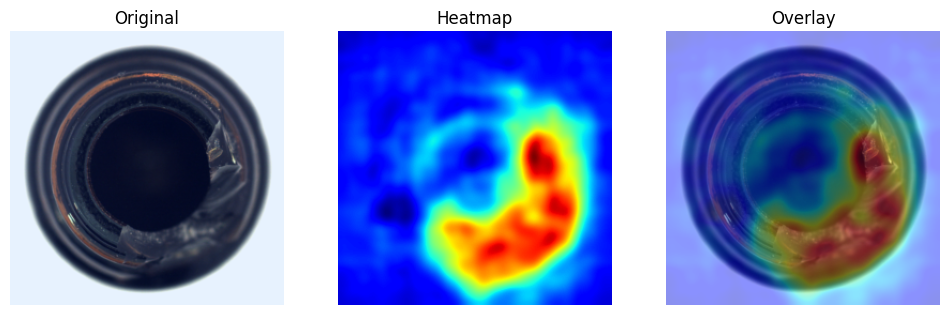

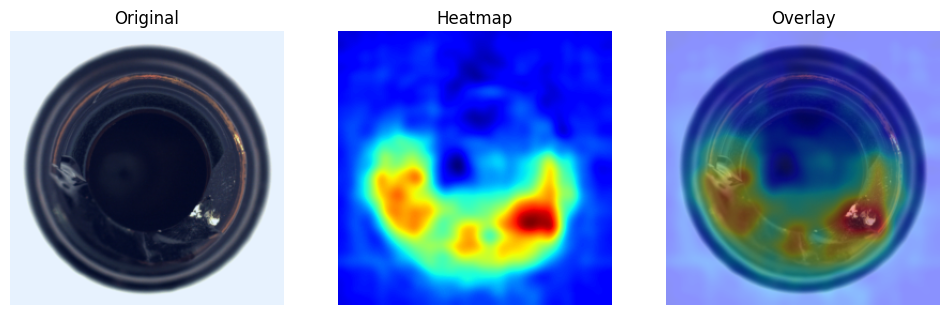

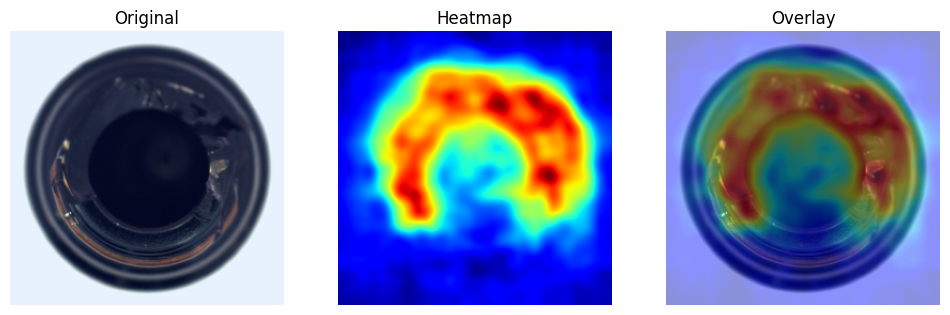

The following callbacks returned in `LightningModule.configure_callbacks` will override existing callbacks passed to Trainer: Evaluator, ImageVisualizer, PostProcessor, PreProcessor
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9753968119621277     │
│       image_F1Score       │    0.9465649127960205     │
│        pixel_AUROC        │     0.978363037109375     │
│       pixel_F1Score       │    0.6969599723815918     │
└───────────────────────────┴───────────────────────────┘

------------------------------
✅ 任務完成！
📊 SUPERSIMPLENET 模型在 bottle 類別的表現:
❌ 執行失敗: 0


In [12]:
MODEL_NAME = "supersimplenet" 
TARGET_CATEGORY = "bottle"
factory = MVTecDataFactory()

try:
    # 1. 初始化執行器
    runner = AnomalyRunner(model_type=MODEL_NAME, category=TARGET_CATEGORY)
    
    # 2. 執行訓練與預測 (內部會自動呼叫 plt.show() 顯示熱力圖)
    metrics = runner.execute(factory)
    
    # 3. 打印最終指標
    print("-" * 30)
    print(f"✅ 任務完成！")
    print(f"📊 {MODEL_NAME.upper()} 模型在 {TARGET_CATEGORY} 類別的表現:")
    for metric_name, value in metrics[0].items():
        print(f"   - {metric_name}: {value:.4f}")

except Exception as e:
    print(f"❌ 執行失敗: {e}")
    # 如果遇到 RecursionError，可以印出更詳細的錯誤提示
    if "recursion" in str(e).lower():
        print("💡 提示: 偵測到遞迴錯誤，請確認 Python 版本為 3.11 且 Engine 已設定 callbacks=[]")
finally:
    # 釋放 RTX 5070 顯存
    if torch.cuda.is_available():
        torch.cuda.empty_cache()